In [21]:
import os
import numpy as np
import eilib as eil
import stimlib as st
from scipy.io import loadmat
from scipy.optimize import minimize, differential_evolution, dual_annealing
import matplotlib.pyplot as plt
import importlib as il
import datetime
import pyswarms as ps
from pyswarms.utils.functions import single_obj as fx
import pandas as pd
from tabulate import tabulate
import seaborn as sb
il.reload(eil)

<module 'eilib' from '/Users/qwertyunicorn/Downloads/eilib.py'>

In [22]:
## Load in electrode array map 
adj_mat = loadmat('/Users/qwertyunicorn/Downloads/real_data/elec_files/adj_mat_512.mat')
elec_coords = loadmat('/Users/qwertyunicorn/Downloads/real_data/elec_files/512Coords.mat')['coords']
## Load in electrical image data
eipath = '/Users/qwertyunicorn/Downloads/real_data/2015-04-14-0/data000/data000_forpy.mat'
eis = st.loadEis(eipath)
ei_cell_ids = st.loadEiCellIds(eipath)
## Load in electrical image data
eipath = '/Users/qwertyunicorn/Downloads/real_data/2015-04-14-0/data000/data000_forpy.mat'
eis = st.loadEis(eipath)
ei_cell_ids = st.loadEiCellIds(eipath)

In [23]:
#calculating the activation function of a axon due to an electrode
def actFun(p_e, i, step, ex, ey, x_all, y, p):
    all_r = [] #store the distances
    graph = [] #store actfunc values
    for index in range(len(x_all)):
      x = x_all[index]
      axon = np.array([x * (10**(-4)),y[index] * (10**(-4))]) #convert points from microns to cm
      elec = np.array([ex * (10**(-4)), ey * (10**(-4))])
      r = np.sqrt((axon[0]-elec[0])**2 + (axon[1]-elec[1])**2)
      all_r.append((r,x))
      r_2d = elec-axon 
      dV_dr = p_e * i * -1/(4 * np.pi * r)
      dl = np.array([x + step, p(x + step)]) - np.array([x - step, p(x - step)])
      dl = dl/np.linalg.norm(dl)
      dV_dr_vec =  np.array([r_2d[0]*dV_dr/r, r_2d[1]*dV_dr/r])
      dV_dl = np.dot(dV_dr_vec, dl)  
      graph.append(dV_dl)
    n_point = min(all_r)[1]
    return (graph, n_point)

def actFuncMultiElec(p_e, i_all, step, e_all, x_all, y,  p=np.poly1d([0, 0, 0])):
    #otherwise compute the sum of the activation functions
    firstDeriv = np.zeros(len(x_all))
    for index in range(len(i_all)):  
      grad, n_point = actFun(p_e, i_all[index], step, e_all[index][0], e_all[index][1], x_all, y, p)
      firstDeriv += np.array(grad)
    return firstDeriv

def neuronMapping(testN):
        ## Pick out a neuron and plot it
        nid = [testN]
        nidx = [ei_cell_ids.index(n) for n in nid[0]]
        ei = [np.min(eis[nx,0], axis=1) for nx in nidx]
        neuronData = {'nid': nid[0], 'nidx': nidx, 'ei': ei, 'soma_pos':[], 'x': [], 'p':[], 'soma_elecs': [] , 'axon_elecs': [], 'mixed_elecs': [], 'dend_elecs': []}

        ## Get cell compartments by looking at signal
        for index in range(len(nidx)):
            soma_elecs = []
            axon_elecs = []
            mixed_elecs = []
            dend_elecs = []

            eiThr = -2
            mysf = -5
            mixedDiff = 0.1
            goodInds = np.nonzero(ei[index]<eiThr)[0]
            for goodInd in goodInds:
                wave = eis[nidx[index],0][goodInd,:].flatten()
                try: 
                    if eil.axonorsoma(wave, mixed_diff_perc = mixedDiff) in ['soma']:
                        soma_elecs.append(goodInd)
                    elif eil.axonorsoma(wave, mixed_diff_perc = mixedDiff) in ['axon']:
                        axon_elecs.append(goodInd)
                    elif eil.axonorsoma(wave, mixed_diff_perc = mixedDiff) in ['mixed']:
                        mixed_elecs.append(goodInd)
                    elif eil.axonorsoma(wave, mixed_diff_perc = mixedDiff) in ['dendrite']:
                        dend_elecs.append(goodInd)
                    else:
                        soma_elecs.append(goodInd)
                except IndexError:
                    continue

            ## Calculate soma position
            weightlist = np.array(soma_elecs)/sum(soma_elecs)
            # Get cell coordinates
            soma_elec_coords_x = [elec_coords[j,0] for j in soma_elecs]
            soma_elec_coords_y = [elec_coords[j,1] for j in soma_elecs]
            # Compute average position
            xcoord = np.dot(soma_elec_coords_x, weightlist)
            ycoord = np.dot(soma_elec_coords_y, weightlist)
            soma_pos = [xcoord,ycoord]
            
            ## Get axon fit
            (p, pder, dirflg, fitx) = eil.getAxonFitNew(eis[nidx[index],0], soma_pos, elec_coords, adj_mat, thr = -2, pdeg = 2)
            numpts = 200
            x = np.linspace(np.min(fitx),np.max(fitx),numpts)

            #save all lists/variables created and later used
            neuronData['soma_pos'].append(soma_pos)
            neuronData['soma_elecs'].append(soma_elecs)
            neuronData['axon_elecs'].append(axon_elecs)
            neuronData['mixed_elecs'].append(mixed_elecs)
            neuronData['dend_elecs'].append(dend_elecs)
            neuronData['x'].append(x)
            neuronData['p'].append(p)

        #Convert Dictionary of Neuron Data top Dataframe
        return pd.DataFrame(neuronData)

def electrodeTesting(dataDict, target_elec, neuronData):

          neurons = [(row['x'], row['p']) for i, row in neuronData.iterrows()]

          #initial values
          p_e = 0.3
          step = 0.1
          i_all = [2, None]
          e_all = [elec_coords[target_elec], [None, None]]

          #generate second electrode guess for gradient methods
          nearestPoints = []
          for neuron in neurons:
              distances = []
              for x in neuron[0]:
                  distances.append((np.sqrt((elec_coords[target_elec][0]-x)**2 + (elec_coords[target_elec][1]-neuron[1](x))**2), x))
              nearestPoints.append([min(distances)[1], neuron[1](min(distances)[1])])
          nearestPoint = np.mean(np.array(nearestPoints), axis=0)
          n_pointx = nearestPoint[0]
          n_pointy = nearestPoint[1]
          guess = np.array([n_pointx, n_pointy]) - (np.array([e_all[0]]) - np.array([n_pointx, n_pointy]))
          dataDict['Nearest Point'] = nearestPoint
          x0 = [-2, guess[0][0], guess[0][1]]

          #Generate the algorthim we seek to optimize using the selected neurons(axons) we have passed it
          def maximumActFuncTest(z):
              i_all[1] = z[0]
              e_all[1] = (z[1],z[2])
              out = 0
              for index, row in neuronData.iterrows():
                  out += max(np.gradient(actFuncMultiElec(p_e, i_all, step, e_all, neuronData['x'][index], neurons[index][1](neurons[index][0]), p=neurons[index][1])))
              return out

          #function specifically fitted to run particle swarm optimization
          def pswarmModel(particles):
              out = []
              for n in particles:
                  out.append(maximumActFuncTest(n))
              return out

          #aligns optimization results to closest electrode
          def snapElectrode(elec_2, target_elec):
              elec_dist = []

              for egx, egy in elec_coords:
                  point = np.array([egx, egy])
                  elec_dist.append((np.sqrt((elec_2[0]-egx)**2 + (elec_2[1]-egy)**2), [egx, egy]))
              if min(elec_dist)[1] in elec_coords[target_elec]:
                  elec_dist.remove(min(elec_dist))
              return min(elec_dist)[1]

          #METHOD 1:
          # Assigning electrode that is closer to 
          # and behind the target neuron by one 
          # electrode to a current that is polar 
          # opposite to the other electrode

          t = datetime.datetime.now()
          neighbors = []
          for neighbor in adj_mat['adj_mat_512'][target_elec][0][0]:
                for extneighbor in adj_mat['adj_mat_512'][neighbor-1][0][0]:
                    if extneighbor-1 != target_elec:
                        neighbors.append((maximumActFuncTest([-5, elec_coords[extneighbor-1][0], elec_coords[extneighbor-1][1]]), extneighbor-1))
          ex2, ey2  = elec_coords[min(neighbors)[1]]
          nearestNeighbor = [-2, ex2, ey2]
          dataDict['NN'].append(maximumActFuncTest(nearestNeighbor))
          dataDict['NN'].append(nearestNeighbor)
          dataDict['NN'].append(datetime.datetime.now() - t)

          #METHOD 2:
          #Global Particle Swarm Optimization

          t = datetime.datetime.now()

          max_bound = np.array([-0.1, n_pointx, 500])
          min_bound = np.array([-4, 0, n_pointy])
          bounds = (min_bound, max_bound)

          options = {'c1' : 0.5, 'c2' : 0.3, 'w' : 0.9}

          optimizer = ps.single.GlobalBestPSO(n_particles=10, dimensions=3, options=options, bounds=bounds)

          cost, pos = optimizer.optimize(pswarmModel, iters=10)
          
          ex2, ey2 = snapElectrode(np.array([pos[1],pos[2]]), target_elec)
          
          GPSO = [pos[0], ex2, ey2]

          dataDict['GPSO'].append(maximumActFuncTest(GPSO))
          dataDict['GPSO'].append(GPSO)
          dataDict['GPSO'].append(datetime.datetime.now() - t)

          # METHOD 3 BFGS Minimization

          t = datetime.datetime.now()

          bounds=[(-4,-0.1),(0,n_pointx),(n_pointy, 500)]
          
          ans = minimize(maximumActFuncTest, x0, bounds=bounds, tol=1*10**-4)

          ex2, ey2 = snapElectrode(np.array([ans.x[1],ans.x[2]]), target_elec)
          
          BFGS = [ans.x[0], ex2, ey2]

          dataDict['BFGS'].append(maximumActFuncTest(BFGS))
          dataDict['BFGS'].append(BFGS)
          dataDict['BFGS'].append(datetime.datetime.now() - t)

          return dataDict


In [24]:
#Stores and organizes output information from various tests
def runTest(testElecs, testNeighbors, includeNeighbors=False):    
    testData = {}
    for testN in testElecs.keys():
        if includeNeighbors:
            # Runs test with two neurons
            for neighbor in testNeighbors[testN]:
                testData[(testN, neighbor)] = {}
                testData[(testN, neighbor)]['Graph'] = neuronMapping([testN, neighbor])
                testData[(testN, neighbor)]['Elecs'] = {}
                for testE in testElecs[testN]:
                    testData[(testN, neighbor)]['Elecs'][testE] = electrodeTesting({'NN': [], 'GPSO': [], 'BFGS': [], 'Nearest Point': (0, 0)}, testE, testData[(testN, neighbor)]['Graph'])
        else:
            # Runs test with one neuron
            testData[testN] = {}
            testData[testN]['Graph'] = neuronMapping([testN])
            testData[testN]['Elecs'] = {}
            for testE in testElecs[testN]:
                testData[testN]['Elecs'][testE] = electrodeTesting({'NN': [], 'GPSO': [], 'BFGS': [], 'Nearest Point': (0, 0)}, testE, testData[testN]['Graph'])
    return testData

In [25]:
# Plots the Neurons and electrodes as seen in electrode arrat
def plotNeuron(neuronData, target_elec, elecData, save=False):
    #plt.close('all')
    fig,ax = plt.subplots(1,1, figsize=(20, 12.5))
    for i, row in neuronData.iterrows():
        eil.plotEiMarked(row['ei'], row['axon_elecs'], ax, elec_coords, size_fac=-5,mymarkedfc='y',myalpha=1,mymarkedalpha=1,noArray=True,thr=-2, heatmap=False)
        eil.plotEiMarked(row['ei'], row['soma_elecs'], ax, elec_coords, size_fac=-5,mymarkedfc='g',myalpha=1,mymarkedalpha=1,noArray=True,thr=-2, heatmap=False)
        eil.plotEiMarked(row['ei'], row['dend_elecs'], ax, elec_coords, size_fac=-5,mymarkedfc='c',myalpha=1,mymarkedalpha=1,noArray=True,thr=-2, heatmap=False)
        ax.scatter(row['soma_pos'][0],row['soma_pos'][1],marker='8',color='r',s=120,zorder=3)
        ax.plot(row['x'],row['p'](row['x']),lw=3,color='r')
    ax.scatter(elec_coords[target_elec][0], elec_coords[target_elec][1], marker='o',color='b', s = 100, label='Target Electrode')
    ax.scatter(elecData['BFGS'][1][1],elecData['BFGS'][1][2], marker='*',color='g', s = 200, label='BFGS')
    ax.scatter(elecData['GPSO'][1][1], elecData['GPSO'][1][2], marker='*',color='c', s = 200, label='GPSO')
    ax.scatter(elecData['NN'][1][1], elecData['NN'][1][2], marker='*',color='m', s = 200, label='NN')
    ax.scatter(elecData['Nearest Point'][0], elecData['Nearest Point'][1], marker='x',color='k', s =200, label = 'Nearest Point')
    ax.set_title('Two Neuron Layout')
    ax.legend()
    ## Add labels for the stimulating electrodes and EI electrodes.
    eil.plotArrayOnly(ax, elec_coords, size=5, myalpha=1, myfc='k', myec='k', heatmap=False)
    ax.legend()
    if save:
        plt.savefig('Neuron Plot - {} - {}.pdf'.format(neuronData['nid'], target_elec))
    plt.show()

In [26]:
#Plots the ACtivation Functions of the neurons given a set of results for a stimulating(target) electrode
def plotActFunc(neuronData, target_elec, elecData, save=False):
    p_e = 0.3
    step = 0.1
    i_all = [2, 0]
    e_all = [elec_coords[target_elec], (0,0)]   
    fig, ax = plt.subplots(1, 1, figsize=(50,20))
    for index, row in neuronData.iterrows():
        yShow = [row['p'](x) for x in row['x']] 
        i_all[1] = elecData['NN'][1][0]
        e_all[1] = (elecData['NN'][1][1], elecData['NN'][1][2])
        print(max(np.gradient(actFuncMultiElec(p_e, i_all, step, e_all, row['x'], yShow, p=row['p']))))
        gradNN = np.gradient(actFuncMultiElec(p_e, i_all, step, e_all, row['x'], yShow, p=row['p']))
        i_all[1] = elecData['GPSO'][1][0]
        e_all[1] = (elecData['GPSO'][1][1], elecData['GPSO'][1][2])
        print(max(np.gradient(actFuncMultiElec(p_e, i_all, step, e_all, row['x'], yShow, p=row['p']))))
        gradGPSO = np.gradient(actFuncMultiElec(p_e, i_all, step, e_all, row['x'], yShow, p=row['p']))
        i_all[1] = elecData['BFGS'][1][0]
        e_all[1] = (elecData['BFGS'][1][1], elecData['BFGS'][1][2])
        print(max(np.gradient(actFuncMultiElec(p_e, i_all, step, e_all, row['x'], yShow, p=row['p']))))
        gradBFGS = np.gradient(actFuncMultiElec(p_e, i_all, step, e_all, row['x'], yShow, p=row['p']))
        ax.plot(row['x'], gradNN, label='NN', color='m')
        ax.plot(row['x'], gradGPSO, label='GPSO', color='c')
        ax.plot(row['x'], gradBFGS, label='BFGS', color='g')
        plt.plot(row['x'], np.gradient(actFun(p_e, i_all[0], step, e_all[0][0], e_all[0][1], row['x'], yShow, p=row['p'])[0]), label='No Second Electrode', color='k')
    ax.set_title('Twp Neuron Activation Function')
    ax.legend()
    if save:
        plt.savefig('Activation Function Plot {} {}.pdf'.format(neuronData['nid'], target_elec))
    plt.show()

In [27]:
#Hand Picked Electrodes and Neurons to test
testElecs = {2416 : [298, 337, 345, 373, 279], 1171 : [40, 378, 375, 418, 355], 2612 : [311, 291, 330, 350, 369, 400], 1891 : [68, 56, 347, 359, 370, 382, 409], 512: [440, 433, 427, 413], 5326: [425, 418, 412], 1771: [299, 342, 311], 2419 : [191, 267, 287, 298, 318]}
#Hand picked neighboring axons to test for two axon scenario
testNeighbors = {2416 : [2419, 2612], 1171 : [1216, 512], 2612: [2146], 1891: [1171], 512 : [1099, 1171], 5326 : [512], 2419:[2972], 1771: [2416]}
#runs the tests
testData = runTest(testElecs, testNeighbors, includeNeighbors=True)

2020-08-26 23:42:41,498 - pyswarms.single.global_best - INFO - Optimize for 10 iters with {'c1': 0.5, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|10/10, best_cost=8.38
2020-08-26 23:42:46,711 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 8.384708604805414, best pos: [  -3.69664926 -182.44002523  217.11514644]
2020-08-26 23:42:48,501 - pyswarms.single.global_best - INFO - Optimize for 10 iters with {'c1': 0.5, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|10/10, best_cost=57
2020-08-26 23:42:53,713 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 57.00781560646802, best pos: [ -2.65838469 104.12662606 326.11622919]
2020-08-26 23:43:01,014 - pyswarms.single.global_best - INFO - Optimize for 10 iters with {'c1': 0.5, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|10/10, best_cost=5.17
2020-08-26 23:43:05,978 - pyswarms.single.global_best - INFO - Optimization finished | best c

In [28]:
# Stores overall results data in a CSV to be exported
results = {'Neuron':[], 'Electrode':[], 'Winner':[], 'NN':[], 'GPSO':[], 'BFGS':[]}
for neuron in testData.keys():
    for elec in testData[neuron]['Elecs']:
        results['Neuron'].append(neuron)
        results['Electrode'].append(elec)
        comparisonList = []
        for key in testData[neuron]['Elecs'][elec].keys():
            if key != 'Nearest Point':
                comparisonList.append([testData[neuron]['Elecs'][elec][key][0], key])
                results[key].append(testData[neuron]['Elecs'][elec][key])
        results['Winner'].append(min(comparisonList)[1])
results = pd.DataFrame(results)
display(results)
results.to_csv('REU-output 1 Neurons.csv')
# Prints: # of lowest costs, margin of lowest cost, and run-time
nn = [0, [], []]
gpso = [0, [], []]
bfgs = [0, [], []]
for i, row in results.iterrows():
    nn[2].append(row['NN'][2].seconds)
    gpso[2].append(row['GPSO'][2].seconds)
    bfgs[2].append(row['BFGS'][2].seconds)
    if row['Winner'] == 'NN':
        nn[0] += 1
        nn[1].append((row['GPSO'][0]-row['NN'][0] + row['BFGS'][0]-row['NN'][0])/2)
    if row['Winner'] == 'GPSO':
        gpso[0] += 1
        gpso[1].append((row['NN'][0]-row['GPSO'][0] + row['BFGS'][0] - row['GPSO'][0])/2)
    if row['Winner'] == 'BFGS':
        bfgs[0] += 1
        bfgs[1].append((row['NN'][0] - row['BFGS'][0] + row['GPSO'][0])/2)
print('NN: ', nn[0], np.average(nn[1]), np.average(nn[2]))
print('GPSO: ', gpso[0], np.average(gpso[1]),  np.average(gpso[2]))
print('BFGS: ', bfgs[0], np.average(bfgs[1]),  np.average(bfgs[2]))

,Neuron,Electrode,Winner,NN,GPSO,BFGS
0,"(2416, 2419)",298,GPSO,"[10.619828328950312, [-2, -195, 210], 0:00:01....","[8.041451077012104, [-3.6966492606672037, -195...","[10.619828328950312, [-2.0, -195, 210], 0:00:0..."
1,"(2416, 2419)",337,GPSO,"[57.79499096237409, [-2, 105, 330], 0:00:01.62...","[56.947556559620985, [-2.6583846896213665, 105...","[60.800814595225134, [-0.13853770104176907, 10..."
2,"(2416, 2419)",345,NN,"[6.432545538170475, [-2, 135, 390], 0:00:01.47...","[7.722049727649752, [-3.502027035392107, 165, ...","[7.876740332204836, [-4.0, 165, 330], 0:00:05...."
3,"(2416, 2419)",373,BFGS,"[3.4771405406086617, [-2, 345, 450], 0:00:01.4...","[3.249570543580152, [-2.841822185541218, 345, ...","[3.020536611382769, [-4.0, 345, 450], 0:00:04...."
4,"(2416, 2419)",279,BFGS,"[40.70914891056041, [-2, -345, 150], 0:00:01.4...","[43.271274972946, [-3.0731295858262437, -375, ...","[40.70914891056041, [-2.0, -345, 150], 0:00:00..."
5,"(2416, 2612)",298,GPSO,"[4.489751682622883, [-2, -195, 210], 0:00:01.5...","[3.3997884045387554, [-3.3967734534472553, -19...","[10.481792232409797, [-2.0, -135, 90], 0:00:00..."
6,"(2416, 2612)",337,NN,"[57.070929132605684, [-2, 105, 330], 0:00:01.5...","[58.98947524112077, [-2.7123759050792713, 75, ...","[58.72920052233071, [-2.003654645373301, 75, 2..."
7,"(2416, 2612)",345,GPSO,"[6.161529610886635, [-2, 165, 330], 0:00:01.39...","[4.729427479349149, [-3.7491877185575917, 165,...","[8.74949062888041, [-2.0095986107828216, 255, ..."
8,"(2416, 2612)",373,GPSO,"[8.138949358240563, [-2, 435, 270], 0:00:01.33...","[6.331173547118843, [-3.8877468260790358, 375,...","[11.411496566676279, [-2.9649107340123013, 345..."
9,"(2416, 2612)",279,BFGS,"[1.0822478230306163, [-2, -345, 150], 0:00:01....","[2.339712545710591, [-3.4544732994437664, -375...","[0.0, [-2.0, -315, 90], 0:00:00.052003]"


NN:  25 9.250200246623217 1.0
GPSO:  17 9.521118260627272 4.538461538461538
BFGS:  10 7.1037794717116345 4.269230769230769


In [29]:
#preps for the grpahing of given neurons and electrode activation function
inputN = (1771,2416)
inputE = 342
print(testData.keys())
print(testData[inputN].keys())
print(testData[inputN]['Elecs'].keys())
print(testData[inputN]['Elecs'][inputE])

dict_keys([(2416, 2419), (2416, 2612), (1171, 1216), (1171, 512), (2612, 2146), (1891, 1171), (512, 1099), (512, 1171), (5326, 512), (1771, 2416), (2419, 2972)])
dict_keys(['Graph', 'Elecs'])
dict_keys([299, 342, 311])
{'NN': [4.555190817790432, [-2, 195, 150], datetime.timedelta(seconds=1, microseconds=358563)], 'GPSO': [4.127135131748173, [-3.704661543174411, 105, 330], datetime.timedelta(seconds=4, microseconds=574946)], 'BFGS': [4.0887286836968855, [-4.0, 105, 330], datetime.timedelta(seconds=3, microseconds=565121)], 'Nearest Point': array([147.81407035, 254.00967217])}


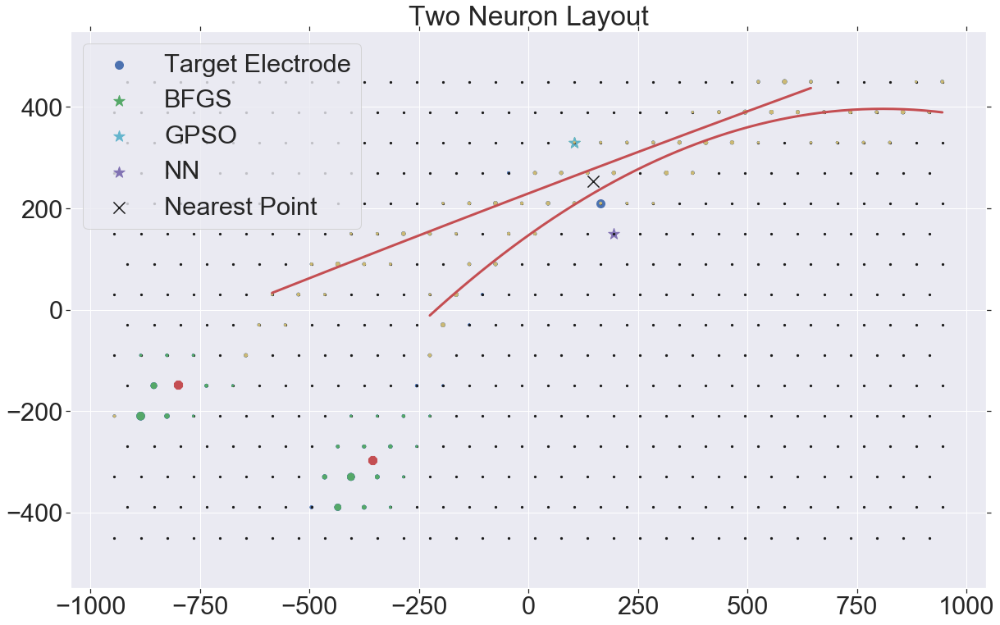

4.089842643405815
3.9217304131906148
3.8806015475638667
0.4653481743846179
0.2054047185575587
0.2081271361330188


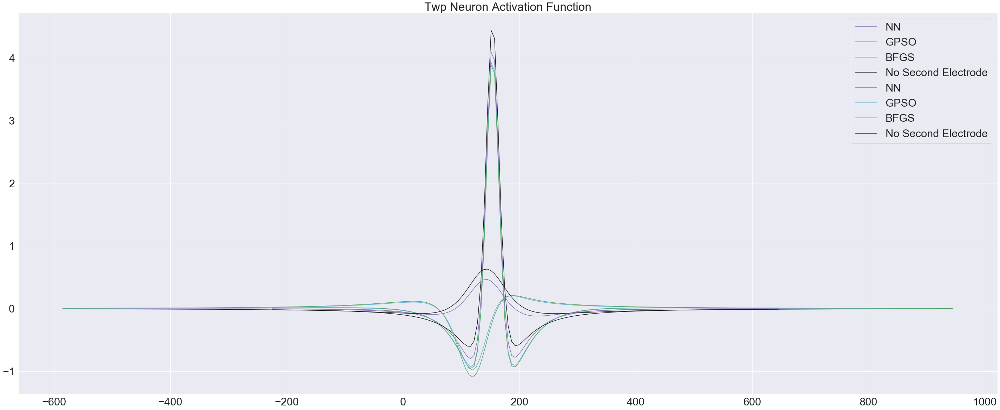

In [30]:
#graphing of given neurons and electrode activation function
neuronData = testData[inputN]['Graph']
target_elec = inputE
elecData = testData[inputN]['Elecs'][target_elec]
plotNeuron(neuronData, target_elec, elecData, save=True)
plotActFunc(neuronData, target_elec, elecData, save=True)

In [32]:
### Reiteration of base funcitons adjusted to be used for heatmap generation ###

#calculating the activation function of a axon due to an electrode
def actFunHM(p_e, i, step, ex, ey, x_all, y, p):
    all_r = [] #store the distances
    graph = [] #store actfunc values
    for index in range(len(x_all)):
      x = x_all[index]
      axon = np.array([x * (10**(-4)), y[index] * (10**(-4))]) #convert points from microns to cm
      elec = np.array([ex * (10**(-4)), ey * (10**(-4))])
      r = np.sqrt((axon[0]-elec[0])**2 + (axon[1]-elec[1])**2)
      all_r.append((r,x))
      r_2d = elec-axon 
      dV_dr = p_e * i * -1/(4 * np.pi * r)
      dl = np.array([x + step, p(x + step)]) - np.array([x - step, p(x - step)])
      dl = dl/np.linalg.norm(dl)
      dV_dr_vec =  np.array([r_2d[0]*dV_dr/r, r_2d[1]*dV_dr/r])
      dV_dl = np.dot(dV_dr_vec, dl)  
      graph.append(dV_dl)
    n_point = min(all_r)[1]
    return (graph, n_point)

#Sums the activation functions of a neuron due to each electrode

def actFuncMultiElecHM(p_e, i_all, step, e_all, x_all, y,  p=np.poly1d([0, 0, 0])):
    #otherwise compute the sum of the activation functions
    firstDeriv = np.zeros(len(x_all))
    for index in range(len(i_all)):  
      grad, n_point = actFunHM(p_e, i_all[index], step, e_all[index][0], e_all[index][1], x_all, y, p)
      firstDeriv += np.array(grad)
    return firstDeriv

#Returns a dataframe of information about suspected axon location and its elements.

def neuronMappingHM(testN):
        ## Pick out a neuron and plot it
        nid = [testN]
        nidx = [ei_cell_ids.index(n) for n in nid[0]]
        ei = [np.min(eis[nx,0], axis=1) for nx in nidx]
        neuronData = {'nid': nid[0], 'nidx': nidx, 'ei': ei, 'soma_pos':[], 'x': [], 'p':[], 'soma_elecs': [] , 'axon_elecs': [], 'mixed_elecs': [], 'dend_elecs': []}

        ## Get cell compartments by looking at signal
        for index in range(len(nidx)):
            soma_elecs = []
            axon_elecs = []
            mixed_elecs = []
            dend_elecs = []

            eiThr = -2
            mysf = -5
            mixedDiff = 0.1
            goodInds = np.nonzero(ei[index]<eiThr)[0]
            for goodInd in goodInds:
                wave = eis[nidx[index],0][goodInd,:].flatten()
                try: 
                    if eil.axonorsoma(wave, mixed_diff_perc = mixedDiff) in ['soma']:
                        soma_elecs.append(goodInd)
                    elif eil.axonorsoma(wave, mixed_diff_perc = mixedDiff) in ['axon']:
                        axon_elecs.append(goodInd)
                    elif eil.axonorsoma(wave, mixed_diff_perc = mixedDiff) in ['mixed']:
                        mixed_elecs.append(goodInd)
                    elif eil.axonorsoma(wave, mixed_diff_perc = mixedDiff) in ['dendrite']:
                        dend_elecs.append(goodInd)
                    else:
                        soma_elecs.append(goodInd)
                except IndexError:
                    continue

            ## Calculate soma position
            weightlist = np.array(soma_elecs)/sum(soma_elecs)
            # Get cell coordinates
            soma_elec_coords_x = [elec_coords[j,0] for j in soma_elecs]
            soma_elec_coords_y = [elec_coords[j,1] for j in soma_elecs]
            # Compute average position
            xcoord = np.dot(soma_elec_coords_x, weightlist)
            ycoord = np.dot(soma_elec_coords_y, weightlist)
            soma_pos = [xcoord,ycoord]
            
            ## Get axon fit
            (p, pder, dirflg, fitx) = eil.getAxonFitNew(eis[nidx[index],0], soma_pos, elec_coords, adj_mat, thr = -2, pdeg = 2)
            numpts = 200
            x = np.linspace(np.min(fitx),np.max(fitx),numpts)

            #save all lists/variables created and later used
            neuronData['soma_pos'].append(soma_pos)
            neuronData['soma_elecs'].append(soma_elecs)
            neuronData['axon_elecs'].append(axon_elecs)
            neuronData['mixed_elecs'].append(mixed_elecs)
            neuronData['dend_elecs'].append(dend_elecs)
            neuronData['x'].append(x)
            neuronData['p'].append(p)

        #Convert Dictionary of Neuron Data top Dataframe
        return pd.DataFrame(neuronData)

#Tests an electrodes optimization performance

def electrodeTestingHM(testE, target_elec, neuronData):

          #initial values
          p_e = 0.3
          step = 0.1
          i_all = [2, None]
          e_all = [(target_elec[0], target_elec[1]), (testE[0], testE[1])]
          neurons = [(row['p'](row['x']), row['p']) for i, row in neuronData.iterrows()]

          #Generate the algorthim we seek to optimize using the selected neurons(axons) we have passed it
          def maximumActFuncTestHM(z):
              out = 0
              i_all[1] = z[0]
              e_all[1] = (z[1],z[2])
              for index, row in neuronData.iterrows():
                  out += max(np.gradient(actFuncMultiElecHM(p_e, i_all, step, e_all, neuronData['x'][index], neurons[index][0], p=neurons[index][1])))
              return out

          return maximumActFuncTestHM([testE[2], testE[0], testE[1]])

In [13]:
#Generats heat map values and print run time
mapping = neuronMappingHM([1771, 2416])
targE = elec_coords[342]
time = datetime.datetime.now()
heat = np.zeros((400, 250))
currVals = np.zeros((400, 250)) 
for y in range(400):
    for x in range(250):
        currents = []
        for c in [0,-2,-4]:
            currents.append((electrodeTestingHM((x, y, c), targE, mapping), c))
        heat[y,x] = min(currents)[0]
        currVals[y,x] = min(currents)[1]
print(datetime.datetime.now()-time)


1:35:28.986432


In [14]:
print(currVals)

[[ 0.  0.  0. ... -4. -4. -4.]
 [ 0.  0.  0. ... -4. -4. -4.]
 [ 0.  0.  0. ... -4. -4. -4.]
 ...
 [-4. -4. -4. ...  0.  0.  0.]
 [-4. -4. -4. ...  0.  0.  0.]
 [-4. -4. -4. ...  0.  0.  0.]]


In [15]:
print(heat)

[[4.43764198 4.43764198 4.43764198 ... 4.35212344 4.35230582 4.35249543]
 [4.43764198 4.43764198 4.43764198 ... 4.35139586 4.35158378 4.351779  ]
 [4.43764198 4.43764198 4.43764198 ... 4.35066086 4.35085444 4.3510554 ]
 ...
 [4.31666242 4.31553504 4.31440111 ... 4.43764198 4.43764198 4.43764198]
 [4.31701052 4.31589712 4.31477741 ... 4.43764198 4.43764198 4.43764198]
 [4.31736504 4.3162655  4.3151599  ... 4.43764198 4.43764198 4.43764198]]


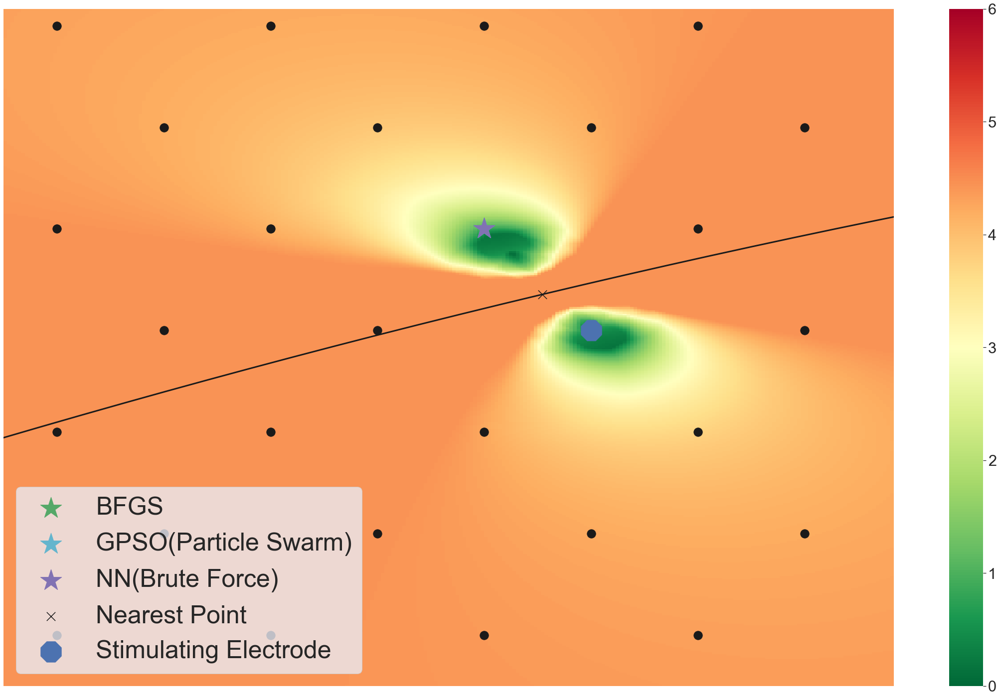

In [20]:
# Plots the heat map
plt.subplots(figsize=(40, 25))
sb.set(font_scale=2.8)
ax = sb.heatmap(heat, vmin=0, vmax=6, cmap="RdYlGn_r")
for i, row in mapping.iterrows():
    ax.plot(row['x'], row['p'](row['x']), color = 'k', lw=3)
eil.plotArrayOnly(ax, elec_coords, size=300, myalpha=1, myfc='k', myec='k', heatmap=True)
ax.scatter(elecData['BFGS'][1][1],elecData['BFGS'][1][2], marker='*',color='g', s = 2000, label='BFGS')
ax.scatter(elecData['GPSO'][1][1], elecData['GPSO'][1][2], marker='*',color='c', s = 2000, label='GPSO (Particle Swarm)')
ax.scatter(elecData['NN'][1][1], elecData['NN'][1][2], marker='*',color='m', s = 2000, label='Naive Method')
ax.scatter(elecData['Nearest Point'][0], elecData['Nearest Point'][1], marker='x',color='k', s =300, label = 'Nearest Point')
ax.scatter(targE[0], targE[1], marker='8',color='b', s = 2000, label='Stimulating Electrode')
#ax.invert_yaxis()
ax.set_axis_off()
ax.legend(loc=3, prop={'size': 50})
plt.savefig('One Neruon Heat Map 3 Current Adjustment.pdf')
plt.show()